In [75]:
# Importing required libraries
import pandas as pd
import csv
import nltk
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.corpus import stopwords
from gensim.corpora import Dictionary
from gensim.models import TfidfModel
nltk.download('stopwords')
from gensim.models import LsiModel, LdaModel, CoherenceModel
import random
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pyLDAvis.gensim_models as gensimvis
import pickle
import pyLDAvis
import os
import re
import warnings
warnings.filterwarnings("ignore")
csv.field_size_limit(1000000000)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/akshay/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


1000000000

In [76]:
# Importing the dataset
speech_data = pd.read_csv('state-of-the-union.csv',names=['year', 'speech'], skiprows=1)
speech_data.head()

,year,speech
0,1790,\nState of the Union Address\nGeorge Washingto...
1,1791,\nState of the Union Address\nGeorge Washingto...
2,1792,\nState of the Union Address\nGeorge Washingto...
3,1793,\nState of the Union Address\nGeorge Washingto...
4,1794,\nState of the Union Address\nGeorge Washingto...


In [77]:
stop_words = stopwords.words('english') + ['america', 'american', 'government', 'americans', 'congress', 'nation', 
    'country', 'people', 'year', 'years', 'new', 'time', 'work', 'world', 
    'make', 'let', 'know', 'need', 'say', 'today', 'tonight', 'every', 'one', 
    'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten', 
    'must', 'upon', 'made', 'take', 'give', 'well', 'may', 'right', 'u', 'state', 
    'would', 'want', 'among', 'many', 'ourselves', 'hers', 'between', 'yourself', 
    'but', 'again', 'there', 'about', 'once', 'during', 'out', 'very', 'having', 
    'with', 'they', 'own', 'an', 'be', 'some', 'for', 'do', 'its', 'yours', 
    'such', 'into', 'of', 'most', 'itself', 'other', 'off', 'is', 's', 'am', 
    'or', 'who', 'as', 'from', 'him', 'each', 'the', 'themselves', 'until', 
    'below', 'are', 'we', 'these', 'your', 'his', 'through', 'don', 'nor', 
    'me', 'were', 'her', 'more', 'himself', 'this', 'down', 'should', 'our', 
    'their', 'while', 'above', 'both', 'up', 'to', 'ours', 'had', 'she', 
    'all', 'no', 'when', 'at', 'any', 'before', 'them', 'same', 'and', 'been', 
    'have', 'in', 'will', 'on', 'does', 'yourselves', 'then', 'that', 'because', 
    'what', 'over', 'why', 'so', 'can', 'did', 'not', 'now', 'under', 'he', 
    'you', 'herself', 'has', 'just', 'where', 'too', 'only', 'myself', 'which', 
    'those', 'i', 'after', 'few', 'whom', 't', 'being', 'if', 'theirs', 'my', 
    'against', 'a', 'by', 'doing', 'it', 'how', 'further', 'was', 'here', 'than', 
    'united', 'states', 'state','help', 'program', 'programs', 'work', 'working','union']


In [78]:
# preprocessing function
def preprocess(text):
    # Tokenize
    tokens = nltk.word_tokenize(text.lower())

    # Removing stopwords and punctuation
    tokens = [t for t in tokens if t not in stop_words and t.isalpha()]
    tokens = [t for t in tokens if len(t) > 1]

    # Performing lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatizer_tokens = [lemmatizer.lemmatize(t) for t in tokens]
    
    # Stemming
    #stemmer = SnowballStemmer("english")
    #stems = [stemmer.stem(t) for t in lemmas]
    
    #return tokens
    return lemmatizer_tokens

# Process all documents in the DataFrame
processed_speech = speech_data['speech'].apply(preprocess)
speech_data['processed_speech']=processed_speech



In [79]:
processed_speech.head()

0    [address, george, washington, december, senate...
1    [address, george, washington, october, senate,...
2    [address, george, washington, november, senate...
3    [address, george, washington, december, senate...
4    [address, george, washington, november, senate...
Name: speech, dtype: object

After multiple checks of coherence scores, model with stemming performed better over all.But, One of the drawbacks ogf this models was that some words were cut short, since stemming is more viguoros than lemmatization.

### Genrating tf-idf scores

In [80]:
import gensim
from gensim import corpora
# Create a dicitonary (lexicon) from the processed speech
dictionary = corpora.Dictionary(processed_speech)

# Create a bag-of-words corpus from the dictionary
bow_corpus = [dictionary.doc2bow(speech) for speech in processed_speech]

# Generate tf-idf scores
tfidf = gensim.models.TfidfModel(bow_corpus)
tfidf_corpus = tfidf[bow_corpus]

# Check the first document's tf-idf representation
tfidf_corpus[0][:10] 


[(0, 0.009102463341794766),
 (1, 0.10365292190481923),
 (2, 0.013920103455292945),
 (3, 0.06677733153552548),
 (4, 0.0634646124117344),
 (5, 0.03610942586224304),
 (6, 0.0030846171145723763),
 (7, 0.061890196522232134),
 (8, 0.02394190530935917),
 (9, 0.040897208311906)]

### 2.LSI MODELLING

In [81]:
# Apply LSI on tfidf_corpus
num_topics = 20  
lsi_model = LsiModel(tfidf_corpus, id2word=dictionary, num_topics=num_topics, chunksize=100,  decay=0.5, random_seed=24)

# Getting the topics
lsi_topics = lsi_model.print_topics(num_topics=num_topics, num_words=20)
lsi_topics


[(0,
  '0.192*"job" + 0.165*"child" + 0.134*"school" + 0.123*"budget" + 0.122*"terrorist" + 0.115*"iraq" + 0.114*"cut" + 0.099*"college" + 0.092*"challenge" + 0.088*"get" + 0.087*"tax" + 0.085*"reform" + 0.084*"parent" + 0.084*"iraqi" + 0.084*"deficit" + 0.083*"medicare" + 0.083*"worker" + 0.082*"spending" + 0.081*"family" + 0.080*"percent"'),
 (1,
  '-0.378*"terrorist" + -0.289*"iraq" + -0.254*"iraqi" + -0.164*"terror" + -0.140*"al" + -0.122*"afghanistan" + -0.118*"regime" + -0.103*"qaeda" + -0.100*"saddam" + -0.088*"hussein" + -0.074*"coalition" + -0.072*"extremist" + 0.071*"economic" + -0.069*"homeland" + -0.062*"enemy" + -0.062*"qaida" + -0.058*"fight" + -0.057*"palestinian" + -0.057*"iran" + -0.053*"baghdad"'),
 (2,
  '0.180*"terrorist" + -0.163*"job" + -0.136*"college" + -0.125*"child" + -0.114*"cut" + 0.113*"iraqi" + -0.112*"school" + 0.110*"iraq" + -0.103*"parent" + -0.086*"challenge" + 0.085*"terror" + -0.082*"teacher" + -0.080*"get" + -0.076*"medicare" + -0.074*"student" + -0

In [82]:
# Compute Coherence Score
coherence_model_lsi= CoherenceModel(model=lsi_model, texts=processed_speech, dictionary=dictionary, coherence='c_v')
coherence_lsi = coherence_model_lsi.get_coherence()
print('Coherence Score: ', coherence_lsi)

Coherence Score:  0.3833241912228477


In [83]:
# Selecting 10 random topics
selected_lsi_topics = random.sample(lsi_topics, 10)
selected_lsi_topics

[(0,
  '0.192*"job" + 0.165*"child" + 0.134*"school" + 0.123*"budget" + 0.122*"terrorist" + 0.115*"iraq" + 0.114*"cut" + 0.099*"college" + 0.092*"challenge" + 0.088*"get" + 0.087*"tax" + 0.085*"reform" + 0.084*"parent" + 0.084*"iraqi" + 0.084*"deficit" + 0.083*"medicare" + 0.083*"worker" + 0.082*"spending" + 0.081*"family" + 0.080*"percent"'),
 (14,
  '0.124*"lending" + 0.102*"corporation" + 0.095*"recovery" + -0.094*"internet" + 0.094*"interstate" + -0.089*"afghan" + -0.086*"job" + -0.075*"percent" + -0.073*"al" + -0.073*"senior" + -0.072*"qaeda" + -0.072*"soviet" + -0.070*"coverage" + 0.069*"bank" + 0.068*"ensure" + 0.068*"terror" + -0.068*"get" + -0.066*"innovation" + 0.065*"invest" + 0.064*"global"'),
 (6,
  '-0.353*"saddam" + -0.267*"hussein" + -0.111*"qaida" + 0.108*"qaeda" + -0.100*"inspector" + -0.089*"dictator" + -0.086*"persian" + -0.083*"iraq" + -0.082*"gulf" + -0.074*"weapon" + -0.070*"senior" + 0.070*"iraqi" + 0.069*"extremist" + -0.068*"disarm" + 0.067*"challenge" + -0.06

In [84]:
# selected_lsi_topics[0]

### The topics that follow here were randomly sampled, but a last minute blunder made the random seed to be nullified. So I manually added the topics that the original description was for.
**Topic 9: Trade Challenges**
<br>
This topic could be highlighting the complications between US ans UK in 1800's, where the topic of neutral commerce and trade challenges were the point of focus between the nations.The words "challenge", "deficit", "tax" could highlight that.
<br><br>
9,
  '-0.157*"steven" + -0.147*"budget" + -0.141*"medicare" + -0.126*"josefina" + -0.116*"mayor" + -0.109*"senior" + -0.106*"drug" + -0.096*"reading" + -0.090*"funding" + 0.090*"college" + 0.090*"challenge" + -0.086*"prescription" + -0.084*"joe" + -0.083*"america" + -0.074*"trillion" + 0.071*"job" + -0.071*"coverage" + -0.070*"priority" + 0.070*"bipartisan" + -0.069*"laura"'),
 (10,

In [85]:
# selected_lsi_topics[1]

**Topic 14: Obama's path for economy's recovery**
<br>
Obama's speech in 2009 highlighted the importnace of re-lending, corporations give more job opportunities and therby reovering the economy. First three wouds of the model could suggest that.
<br><br>
(14,
  '0.124*"lending" + 0.102*"corporation" + 0.095*"recovery" + -0.094*"internet" + 0.094*"interstate" + -0.089*"afghan" + -0.086*"job" + -0.075*"percent" + -0.073*"al" + -0.073*"senior" + -0.072*"qaeda" + -0.072*"soviet" + -0.070*"coverage" + 0.069*"bank" + 0.068*"ensure" + 0.068*"terror" + -0.068*"get" + -0.066*"innovation" + 0.065*"invest" + 0.064*"global"'),

In [86]:
# selected_lsi_topics[2]

**Topic 19:Conclusion of Ohio war**
<br>
This could be the speech from 1705, where G Washington highlights the conclusion of war between certain Indian tribes of Ohio.Interstate and covenant could reflect that
<br><br>
(19,
  '0.148*"percent" + -0.128*"covenant" + -0.103*"ca" + 0.101*"interstate" + 0.096*"corporation" + 0.087*"spending" + -0.087*"bureaucracy" + 0.085*"investment" + 0.079*"targeted" + 0.076*"deficit" + 0.072*"stack" + -0.072*"lending" + 0.067*"qaeda" + -0.067*"underclass" + 0.065*"los" + 0.065*"angeles" + 0.064*"aisle" + 0.064*"learning" + 0.063*"challenge" + 0.063*"blame"')]

In [87]:
# selected_lsi_topics[3]

**TOPIC 12: Address at Camp David**
<br>
This was when US and USSR were at cold war.yeltsin was a prominent figure during this time and the tension of nuclear warheads peaked and thepresident addressed about withdrawing those missiles and holding peace talks.
<br><br>
(12,
  '0.120*"america" + 0.113*"steven" + -0.098*"yeltsin" + 0.096*"challenge" + -0.091*"nuclear" + 0.090*"josefina" + -0.089*"hussein" + -0.088*"weapon" + -0.086*"missile" + -0.086*"warhead" + 0.085*"medicare" + 0.077*"persian" + -0.077*"tell" + 0.074*"budget" + -0.073*"ask" + 0.071*"bureaucracy" + 0.069*"gulf" + -0.065*"speicher" + 0.063*"reading" + 0.062*"covenant"'),

In [88]:
# selected_lsi_topics[4]

**Topic 18: Country's economy**
<br>
This cpuld be the speech from 1995, stressed upon for increasing the econmy quality and importance of trade agreements for gas and oil.
<br><br>
(18,
  '0.113*"gas" + 0.109*"oil" + 0.108*"jackie" + 0.104*"got" + 0.091*"bet" + -0.087*"lobbyist" + -0.086*"challenge" + -0.084*"cut" + 0.075*"spill" + 0.074*"get" + -0.073*"afghan" + 0.072*"corporation" + 0.072*"manufacturer" + 0.072*"interstate" + -0.071*"democrat" + 0.070*"bryan" + 0.070*"company" + 0.070*"milk" + -0.066*"invest" + 0.066*"manufacturing"'),


In [89]:
# selected_lsi_topics[5]

**Topic 6: Middle easter affairs**
<br>
This could be the speech from 1999 about saddam hussein and middle easter affairs and UN trying to interven and curb his growth
<br><br>
(6,
  '-0.353*"saddam" + -0.267*"hussein" + -0.111*"qaida" + 0.108*"qaeda" + -0.100*"inspector" + -0.089*"dictator" + -0.086*"persian" + -0.083*"iraq" + -0.082*"gulf" + -0.074*"weapon" + -0.070*"senior" + 0.070*"iraqi" + 0.069*"extremist" + -0.068*"disarm" + 0.067*"challenge" + -0.067*"tell" + -0.065*"biological" + 0.063*"goal" + 0.062*"communist" + -0.061*"get"'),
 

In [90]:
# selected_lsi_topics[6]

**Topic 4: Post cold war**
<br>
This speech could  emphasize the importance of trade agreements between Soviet and US, investing in education, technology, and research. It also mentions the protection of the environment, particularly water sources.
<br><br>
(4,
  '-0.151*"soviet" + 0.134*"college" + -0.111*"economic" + 0.100*"medicare" + 0.098*"child" + 0.095*"school" + -0.092*"billion" + -0.092*"communist" + -0.088*"spending" + -0.087*"inflation" + 0.087*"internet" + 0.080*"parent" + -0.076*"budget" + 0.075*"teacher" + 0.074*"company" + -0.074*"freedom" + 0.072*"bipartisan" + 0.068*"student" + -0.067*"tell" + -0.066*"aggression"'),
 

In [91]:
# selected_lsi_topics[7]

**Topic 10: Missile Crisis**
<br>
This could be again reflecting on the missile crisis between USSR and US during the cold war.yeltsin m missile,warheadm america reflect on that.
<br><br>
(10,
  '0.162*"drug" + -0.118*"missile" + -0.101*"tell" + -0.099*"yeltsin" + -0.098*"mayor" + -0.094*"someone" + -0.092*"big" + 0.092*"weapon" + -0.091*"desert" + 0.091*"deficit" + -0.086*"warhead" + -0.086*"america" + 0.085*"cut" + 0.083*"cocaine" + -0.073*"century" + 0.069*"clean" + 0.067*"hussein" + -0.066*"speicher" + 0.065*"space" + -0.064*"maybe"'),
 

In [92]:
# selected_lsi_topics[8]

**Topic 2: State of Education**
<br>
This could brefrom early 2000's where job econmomy, child education and iraqi conflicts were at its peak.
<br><br>
2,
  '0.180*"terrorist" + -0.163*"job" + -0.136*"college" + -0.125*"child" + -0.114*"cut" + 0.113*"iraqi" + -0.112*"school" + 0.110*"iraq" + -0.103*"parent" + -0.086*"challenge" + 0.085*"terror" + -0.082*"teacher" + -0.080*"get" + -0.076*"medicare" + -0.074*"student" + -0.072*"ca" + -0.071*"deficit" + 0.067*"regime" + -0.065*"family" + -0.064*"internet"'),
 

In [93]:
# selected_lsi_topics[9]  

**Topic 5: Retun of troops from Iraq**
<br>
As the title suggests this could be Obama's 2012 speech after recalling the troops from iraq. The above corpus also indicate that.
<br><br>
(5,
  '-0.255*"terrorist" + 0.239*"iraq" + 0.201*"iraqi" + -0.169*"afghanistan" + -0.169*"islamic" + -0.146*"terror" + -0.122*"camp" + 0.121*"qaeda" + -0.117*"muslim" + 0.116*"al" + -0.114*"regime" + 0.106*"saddam" + -0.088*"america" + -0.086*"homeland" + 0.085*"extremist" + -0.079*"taliban" + -0.076*"grief" + -0.068*"job" + -0.065*"shannon" + -0.065*"terrorism"')

### 3.LDA MODELLING

In [94]:
# LDA Topic Modeling

# Apply LDA on tfidf_corpus
lda_model = LdaModel(tfidf_corpus, id2word=dictionary, num_topics=40, decay=0.5, chunksize=100, iterations=1000, random_state=24)

# Get the topics
lda_topics = lda_model.show_topics(num_topics=num_topics, formatted=False,num_words=20)
lda_topics


[(9,
  [('ross', 0.00016644217),
   ('yorktown', 0.00016640303),
   ('consular', 0.00014608048),
   ('friendly', 0.0001399124),
   ('consols', 0.00013849384),
   ('injurious', 0.00013667003),
   ('poinsett', 0.00013363811),
   ('lively', 0.00013284569),
   ('evinced', 0.0001326988),
   ('colombia', 0.0001311912),
   ('although', 0.00012742663),
   ('diplomatic', 0.00012734975),
   ('guaranty', 0.00012492588),
   ('sanitary', 0.00012452596),
   ('err', 0.0001239345),
   ('qualify', 0.00012393054),
   ('mode', 0.00011845764),
   ('minister', 0.00011834679),
   ('sinking', 0.0001180966),
   ('intimate', 0.00011596992)]),
 (17,
  [('bank', 0.0006096009),
   ('honduras', 0.00033288248),
   ('iglesias', 0.00024313555),
   ('circulation', 0.00022973714),
   ('deposit', 0.00022933834),
   ('treaty', 0.00020883139),
   ('lake', 0.00017098924),
   ('spanish', 0.00016604309),
   ('loan', 0.00016210772),
   ('tribe', 0.0001608636),
   ('gold', 0.00016066479),
   ('paper', 0.00016041579),
   ('silv

In [95]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=processed_speech, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.39133046302580227


In [96]:
# Sampling 10 topics from lda_topics
selected_lda_topics = random.sample(lda_topics, 10)
selected_lda_topics

[(23,
  [('production', 0.0012989471),
   ('construction', 0.00090617593),
   ('ship', 0.0006776201),
   ('enemy', 0.0006686922),
   ('navy', 0.00060933153),
   ('supply', 0.000607866),
   ('material', 0.00056693546),
   ('pressure', 0.00053548056),
   ('various', 0.0005296446),
   ('armistice', 0.0005212849),
   ('cruiser', 0.0004901933),
   ('district', 0.00047699947),
   ('particularly', 0.00045747435),
   ('moderate', 0.00044800033),
   ('position', 0.00043597393),
   ('work', 0.0004344185),
   ('encouragement', 0.00043028974),
   ('merit', 0.00042431353),
   ('affected', 0.0004020185),
   ('addition', 0.00039836616)]),
 (2,
  [('financial', 0.0024972472),
   ('tariff', 0.0018179964),
   ('manufacturer', 0.0015569103),
   ('price', 0.0014915323),
   ('combination', 0.0014710035),
   ('farmer', 0.0014361985),
   ('manufacturing', 0.0013121164),
   ('statute', 0.0010453825),
   ('cent', 0.0010313252),
   ('profit', 0.0010233581),
   ('money', 0.00097019447),
   ('train', 0.0009032680

In [97]:
#selected_lda_topics[0]

**Topic  34: Abolition of slavetrade**
<br>
THis could be about the abolition of the slave trade in Africa, highlighting international concerns and global interactions pertaining to human rights and trade.
<br><br>

 (34,
  [('slave', 0.00030089813),
   ('african', 0.00020508782),
   ('postal', 0.00018736665),
   ('marcy', 0.00016731459),
   ('suffrage', 0.00015156114),
   ('whilst', 0.00014936917),
   ('tent', 0.00014533677),
   ('shanghai', 0.00014501768),
   ('indian', 0.00014375163),
   ('epidemic', 0.00014350096),
   ('colored', 0.00014347247),
   ('silver', 0.00013534355),
   ('deficiency', 0.00013372795),
   ('june', 0.00013279344),
   ('quarantine', 0.00012832525),
   ('yellow', 0.00012823398),
   ('estimated', 0.00012557778),
   ('fiscal', 0.00012528246),
   ('importation', 0.00012445578),
   ('island', 0.0001236982)]),

In [98]:
# selected_lda_topics[1]

**Topic 14: Civil War**
<br>
it's evident that this topic likely pertains to the U.S. Civil War era, specifically focusing on constitutional discussions, the secession of states, and the broader themes of slavery and political affiliations. The presence of words like "secession," "confederacy," and "slavery" strongly suggest a connection to the Civil War period. The inclusion of terms like "constitution" and "elector" point to fundamental political and governance discussions that were pivotal during this time.
<br><br>
(14,
  [('constitution', 0.0002854432),
   ('freedman', 0.00025582462),
   ('slavery', 0.00022472178),
   ('treason', 0.00020263025),
   ('confederation', 0.00019940425),
   ('confederacy', 0.00019038617),
   ('elector', 0.0001819459),
   ('gentleman', 0.00016939077),
   ('legislature', 0.00016834379),
   ('affection', 0.00016442961),
   ('secede', 0.00016228821),
   ('commissioner', 0.00016017555),
   ('philadelphia', 0.0001586721),
   ('article', 0.0001570974),
   ('secession', 0.00015614528),
   ('perpetual', 0.00015513923),
   ('delegated', 0.0001508014),
   ('resistance', 0.00014995184),
   ('capture', 0.00014662751),
   ('elective', 0.00014443717)]),

In [99]:
# selected_lda_topics[2]

**Topic 12: Koszta affir**
<br>
This might relate to the Koszta Affair, a diplomatic incident between the United States and the Austrian Empire in the 1850s."Smyrna" and "croix" keywords relate to that.
<br><br>
(12,
  [('acre', 0.0003118133),
   ('smyrna', 0.00021799435),
   ('croix', 0.00020984112),
   ('naval', 0.00018620268),
   ('koszta', 0.00018563363),
   ('commissioner', 0.00017445098),
   ('gentleman', 0.00017056007),
   ('scoodiac', 0.00016549126),
   ('consul', 0.00016487246),
   ('disbursement', 0.00016100859),
   ('emancipation', 0.00015922543),
   ('navy', 0.00014852898),
   ('france', 0.00014803962),
   ('rebellion', 0.00014795829),
   ('demarcation', 0.00014499763),
   ('quantity', 0.0001446769),
   ('fundy', 0.00014342363),
   ('postal', 0.00014202221),
   ('magnitude', 0.0001375654),
   ('domain', 0.00013559333)]),

In [100]:
# selected_lda_topics[3]

**Topic 27: Territorial growth & Louisiana**
Many of these terms like "Wabash," "Louisiana," "Ohio," "District," and "Delaware" are geographical, possibly relating to territorial growth, disputes, or internal improvements in ealy 1800's by Thomas JEfferson. Louisian was the centre ofthe spotlight for the expansion, followed bu other cities given above.

<br><br>
(27,
  [('wabash', 0.00015895859),
   ('calculate', 0.00015337823),
   ('irregularity', 0.00014164702),
   ('louisiana', 0.00014068108),
   ('upward', 0.00014059537),
   ('ohio', 0.00013780843),
   ('district', 0.00013395211),
   ('delaware', 0.00013367436),
   ('augmentation', 0.0001295928),
   ('ensues', 0.00012606915),
   ('consolidates', 0.00012603616),
   ('kaskaskias', 0.00012600186),
   ('cession', 0.00012595697),
   ('fronting', 0.00012595087),
   ('title', 0.00012594038),
   ('wanting', 0.000120162214),
   ('ceded', 0.00012008233),
   ('commanding', 0.0001188846),
   ('utility', 0.00011879663),
   ('jefferson', 0.000117679185)]),


In [101]:
#selected_lda_topics[4]

**Topic 16: California acquisiton**
<br>
in 1849, Zachary Taylor's address discussed the recent acquisition of California following the Mexican-American War. The address also highlighted ongoing diplomatic efforts with European nations and the significance of treaties. The reference to "Frankfort" suggests discussions or agreements with German states.
<br><br>
 (16,
  [('california', 0.00022751767),
   ('installment', 0.00019351169),
   ('minister', 0.00017865525),
   ('payable', 0.00017302019),
   ('discriminating', 0.00016378082),
   ('royal', 0.00016282656),
   ('frankfort', 0.00015537292),
   ('isthmus', 0.00014498616),
   ('vessel', 0.00013720032),
   ('island', 0.00013664905),
   ('chamber', 0.00013610776),
   ('king', 0.00013526913),
   ('granada', 0.00013498848),
   ('portugal', 0.00013461581),
   ('french', 0.00013317846),
   ('constructed', 0.00013317281),
   ('paris', 0.00013208983),
   ('spain', 0.00013208075),
   ('treaty', 0.00013195198),
   ('bogota', 0.00013009485)]),

In [102]:
#selected_lda_topics[5]

**Topic 2: Economy**
<br>
This topic could technically be frim any soeech, beacuse the address in most of the years focus with the above keywords.But"Kansas" and "Chile" could be the annexure of kansas into the union and the latter could be about the trade relaations.
<br><br>
(2,
  [('financial', 0.0024972472),
   ('tariff', 0.0018179964),
   ('manufacturer', 0.0015569103),
   ('price', 0.0014915323),
   ('combination', 0.0014710035),
   ('farmer', 0.0014361985),
   ('manufacturing', 0.0013121164),
   ('statute', 0.0010453825),
   ('cent', 0.0010313252),
   ('profit', 0.0010233581),
   ('money', 0.00097019447),
   ('train', 0.00090326805),
   ('fee', 0.00089409336),
   ('majority', 0.00087521184),
   ('consumer', 0.00086194725),
   ('willing', 0.0008593015),
   ('kansa', 0.0008532414),
   ('fine', 0.00082222),
   ('chile', 0.0008114416),
   ('judge', 0.0007989328)]),

In [103]:
#selected_lda_topics[6]

**Topic 24: Early banking challenges**
<br>
This could be from the early 1800's when the givernment was trying to expand Mint locations and the subscriptions that bank lent out, trying to move bank as a pivotal fianncail institution.
<br><br>
 (24,
  [('subscription', 0.00019481799),
   ('appointment', 0.00018845846),
   ('cable', 0.00017378543),
   ('examination', 0.00017356234),
   ('partisan', 0.00015436763),
   ('florin', 0.00014352164),
   ('pleasing', 0.00014217534),
   ('utah', 0.0001406025),
   ('subordinate', 0.00013963011),
   ('provisionally', 0.00013874387),
   ('silver', 0.00013819088),
   ('examiner', 0.00013805571),
   ('attach', 0.00013158422),
   ('removal', 0.00013153041),
   ('official', 0.00012942882),
   ('object', 0.00012910512),
   ('note', 0.00012884501),
   ('infringe', 0.00012872762),
   ('mint', 0.00012870261),
   ('resumption', 0.00012860417)]),


In [104]:
#selected_lda_topics[7]

**Topic 21: Educational reform**
<br>
This is also a bit vague, because there were a lot of educational and health reforms being carried out in the early 1900's anf the words  do give out a similar meaning.
<br><br>
 (21,
  [('school', 0.013230343),
   ('reform', 0.008356597),
   ('health', 0.007384109),
   ('education', 0.0066625406),
   ('century', 0.0053684),
   ('ago', 0.0030632932),
   ('crime', 0.002989731),
   ('next', 0.0029379171),
   ('lead', 0.0028233957),
   ('president', 0.0027582839),
   ('thanks', 0.0026148509),
   ('competitive', 0.0025913112),
   ('deserve', 0.0025218837),
   ('member', 0.0025008793),
   ('relief', 0.0024997827),
   ('friend', 0.002444178),
   ('company', 0.0024157667),
   ('troop', 0.002251433),
   ('safe', 0.0021154752),
   ('human', 0.002071978)]),

In [105]:
#selected_lda_topics[8]

**Topic 33: Maritime affairs and tripoli**
<br>
This could be one of the speeches from late 1790's.This was when Tripoli in Lebanon was a bit tensed up with US.Navy had to intervene to calm things down.'tripoli', 'vessil','sea' go along withthat.
<br><br>
33,
  [('complement', 0.00016742173),
   ('certify', 0.00016186047),
   ('fever', 0.00015776102),
   ('peaceable', 0.00014239889),
   ('hovering', 0.00013532933),
   ('plundered', 0.0001310879),
   ('tripoli', 0.00012461396),
   ('vessel', 0.00012307541),
   ('belligerent', 0.00012163334),
   ('sea', 0.00011994762),
   ('lessen', 0.00011594966),
   ('competent', 0.000115864335),
   ('creek', 0.00011147623),
   ('consolidate', 0.00011146789),
   ('countenance', 0.000111438276),
   ('younger', 0.00011140673),
   ('unreached', 0.000110161905),
   ('ransom', 0.000110141176),
   ('bottomed', 0.000110137444),
   ('ocmulgee', 0.000110127155)]),

In [106]:
#selected_lda_topics[9]

**Topic 0: Early challenges faced**
<br>
The address speaks about the confidence in the government and the resilience of the community. It hints at the need for continuous vigilance and a call to action to ensure the nation's stability and prosperity, suggesting the challenges faced by the young Republic.
<br><br>
(0,
  [('enemy', 0.0047916244),
   ('social', 0.0041666203),
   ('energy', 0.003987979),
   ('community', 0.003933833),
   ('across', 0.003811257),
   ('proud', 0.003761091),
   ('victory', 0.0033465137),
   ('better', 0.0030107116),
   ('company', 0.0029691225),
   ('asked', 0.0028358442),
   ('bank', 0.0024364612),
   ('immigrant', 0.0023252445),
   ('god', 0.0023135394),
   ('hold', 0.0022710783),
   ('murder', 0.0020565968),
   ('election', 0.0020298352),
   ('gulf', 0.0019050984),
   ('like', 0.0018942457),
   ('simple', 0.0018618818),
   ('discipline', 0.001739749)])]


### 4. LDA BY DECADE

EACH DECADE WITH 4 TOPICS

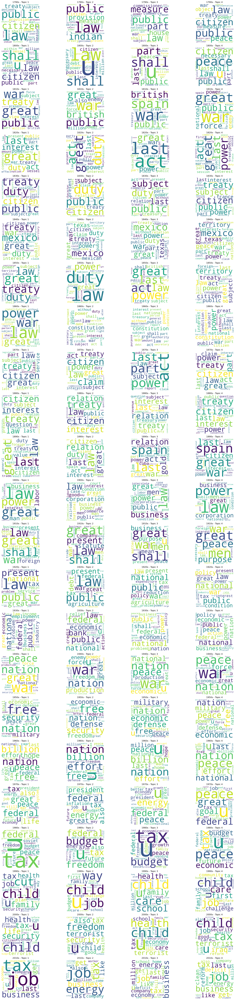

In [107]:
# Re-initialize LDA models for each decade with 4 topics
lda_models_by_decade = []
speech_data['decade'] = (speech_data['year'] // 10) * 10
for decade, group in speech_data.groupby('decade'):
    group_corpus = [dictionary.doc2bow(doc) for doc in group['processed_speech']]
    group_lda_model = LdaModel(group_corpus, id2word=dictionary, num_topics=4, random_state=42)
    lda_models_by_decade.append(group_lda_model)

# Adjusting the figure size and layout to accommodate all decades
plt.figure(figsize=(20, 100))

# Using the list of LDA models and the decades list
for idx, model in enumerate(lda_models_by_decade):
    for topic in range(4):
        topic_words = dict(model.show_topic(topic, topn=30)) 
        wc = WordCloud(background_color='white', width=400, height=400).generate_from_frequencies(topic_words)
        
        plt.subplot(30, 4, idx*4 + topic + 1)  
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"{list(range(1790, 2020, 10))[idx]}s - Topic {topic+1}")

plt.tight_layout()
plt.show()


In [108]:
# Function to display top terms for each topic in each decade
def display_top_terms_for_topics(lda_models_by_decade, num_terms=10):
    decades = list(range(1790, 2020, 10))
    
    for idx, model in enumerate(lda_models_by_decade):
        print(f"Decade: {decades[idx]}s\n{'-'*25}")
        for topic in range(4):
            terms = model.show_topic(topic, num_terms)
            term_strings = [f"{word[0]} ({word[1]:.3f})" for word in terms]
            print(f"Topic {topic+1}: {', '.join(term_strings)}\n")
        print('\n')

# Display the top terms for each topic
display_top_terms_for_topics(lda_models_by_decade)


Decade: 1790s
-------------------------
Topic 1: law (0.003), public (0.002), citizen (0.002), treaty (0.002), provision (0.002), measure (0.002), part (0.002), shall (0.002), subject (0.002), war (0.002)

Topic 2: law (0.002), public (0.002), indian (0.002), provision (0.002), measure (0.002), citizen (0.002), treaty (0.001), object (0.001), part (0.001), present (0.001)

Topic 3: public (0.002), law (0.002), measure (0.002), part (0.002), house (0.002), commissioner (0.002), war (0.002), shall (0.002), commerce (0.001), gentleman (0.001)

Topic 4: public (0.003), law (0.002), citizen (0.002), peace (0.002), treaty (0.002), measure (0.002), object (0.002), power (0.002), war (0.002), representative (0.002)



Decade: 1800s
-------------------------
Topic 1: shall (0.003), u (0.003), citizen (0.003), law (0.003), public (0.003), necessary (0.002), peace (0.002), part (0.002), interest (0.002), great (0.002)

Topic 2: u (0.003), law (0.002), shall (0.002), public (0.002), citizen (0.002

YEARLY SPEECHES 
<br>Created as dataframe to better understand how topics change iver time

In [109]:

# Aggregate speeches by year
yearly_speeches = speech_data.groupby('year')['speech'].apply(' '.join)

# Preprocess aggregated yearly speeches
processed_yearly_speeches = yearly_speeches.apply(preprocess)

# Create bag-of-words representation for each aggregated yearly speech
yearly_bow_corpus = [dictionary.doc2bow(speech) for speech in processed_yearly_speeches]

# Dictionary to store the LSI and LDA topics for each year
topics_by_year = {}
num_topics_per_year = 5

# Performing LSI and LDA on yearly speeches
for year, bow in zip(yearly_speeches.index, yearly_bow_corpus):
    # LSI topics for the year
    lsi_model_year = LsiModel([bow], id2word=dictionary, num_topics=num_topics_per_year)
    lsi_topics_year = lsi_model_year.print_topics(num_topics=num_topics_per_year, num_words=5)
    
    # LDA topics for the year
    lda_model_year = LdaModel([bow], id2word=dictionary, num_topics=num_topics_per_year)
    lda_topics_year = lda_model_year.print_topics(num_topics=num_topics_per_year, num_words=5)
    
    # Store the topics in the dictionary
    topics_by_year[year] = {
        "LSI": lsi_topics_year,
        "LDA": lda_topics_year
    }

# Initialising the data list
data = []

# Loop through the topics by year
for year, topic_info in topics_by_year.items():
    for model_type, topics in topic_info.items():
        for topic in topics:
            topic_num, terms = topic
            data.append([year, model_type, topic_num + 1, terms])

# Creating a dataframe for easier interpretation of the topics
df_topics = pd.DataFrame(data, columns=['Year', 'Model', 'Topic Number', 'Terms'])
df_topics


,Year,Model,Topic Number,Terms
0,1790,LSI,1,"0.254*""u"" + 0.159*""public"" + 0.159*""measure"" +..."
1,1790,LDA,1,"0.000*""u"" + 0.000*""part"" + 0.000*""object"" + 0...."
2,1790,LDA,2,"0.000*""u"" + 0.000*""great"" + 0.000*""public"" + 0..."
3,1790,LDA,3,"0.000*""u"" + 0.000*""public"" + 0.000*""great"" + 0..."
4,1790,LDA,4,"0.001*""u"" + 0.001*""measure"" + 0.001*""public"" +..."
...,...,...,...,...
1303,2012,LDA,1,"0.002*""job"" + 0.001*""business"" + 0.001*""tax"" +..."
1304,2012,LDA,2,"0.002*""job"" + 0.001*""tax"" + 0.001*""energy"" + 0..."
1305,2012,LDA,3,"0.002*""job"" + 0.001*""tax"" + 0.001*""energy"" + 0..."
1306,2012,LDA,4,"0.003*""job"" + 0.003*""tax"" + 0.002*""get"" + 0.00..."


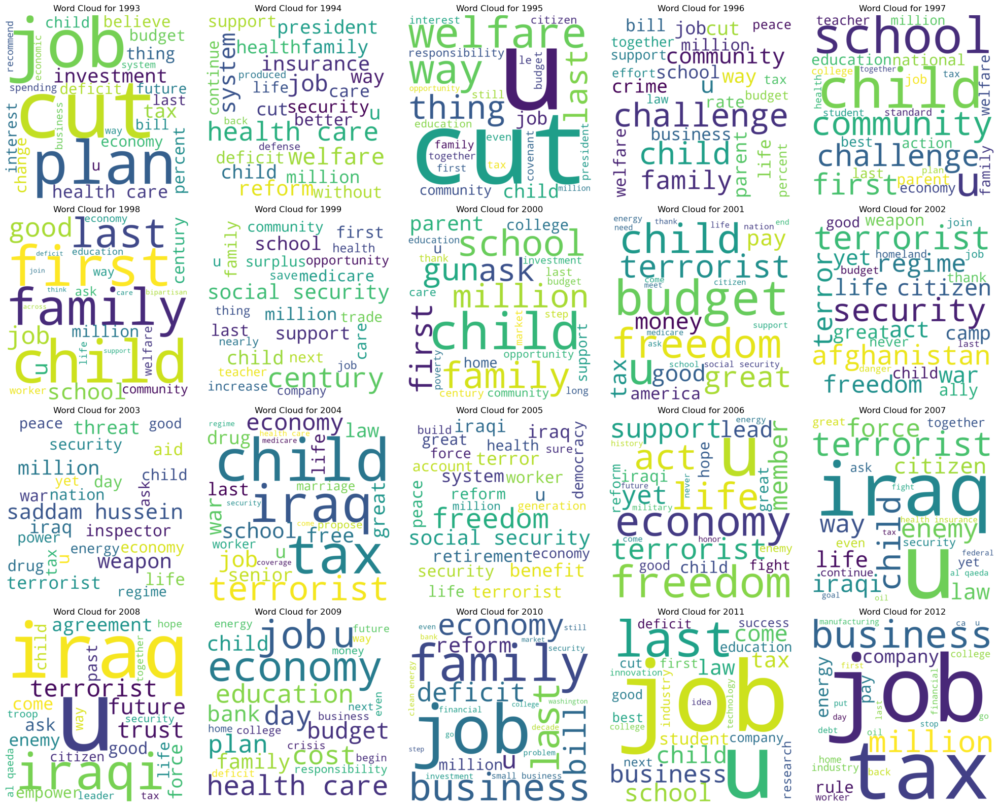

In [110]:
# Number of years to generate word clouds for (last 20 years)
num_years = 20

# Select the speeches for the last 20 years
selected_speeches = yearly_speeches.tail(num_years)

# Create word clouds
wordclouds = {}
for year, speech in selected_speeches.items():
    # Preprocess the speech
    words = preprocess(speech)
    
    # Create the word cloud
    wordcloud = WordCloud(background_color='white', width=800, height=800, max_words=25).generate(' '.join(words))
    wordclouds[year] = wordcloud

# Display word clouds in a 4x5 grid
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20, 16))
for ax, (year, wordcloud) in zip(axes.ravel(), wordclouds.items()):
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f"Word Cloud for {year}")

plt.tight_layout()
plt.show()


## Sumarisation of previous wordclouds in 20th and 21st century. <br>Multiple wordclouds were created earlier for better understanding of the topics.


After analysing the previous wordclouds thoroughly, thefollwoing conclusion can be reached:<br>
19th Century:<br><br>
**1900s - 1920s:End of WWI and start of Progressive era** <br>
    This period was during the progressive era and World war I, there are dominant terms like "war","power", "allies" shown on the wordcloud for the war.<br>There are also terms like "railroad", "labor ", "commerce" to reflect on the econmic bboom around the time.
<br><br>
**1930s - 1940s: Great depression and WW2**<br>
    This was the period of econmic downturn and New Deal Policy. Terms like "employment","great","economiv" support this.<br>There is also terms like "war", "nation","peace","freedom", to support this.<br><br>
**1950s - 1960s: Civil Rights and Vietnam**<br>
    This was thetime of peak coldwar and civilrights movement. Terms like "soviet", "communist", "war","militrary" substantiate the observation of both coldwar and Vietnam war.<br>
    For the civil rights movement, words like "freedom", "peace',"potest" gives evidence.<br>
    There is also "president" often in the wordcloud, which could showcase the assasination of then president John F Kennedy.<br><br>
**1970s - 1980s: End of cold war and social changes**<br>
    Again words like "soviet", "peace" showcase the end of cold war in the era.<br>
    For the social changes, words like "future","federal","energy","inflation" reflect that.<br><br>
**1990s: Globalisation**<br>
    This period shows the advancements in termns of livelihood with terms like childcare ,health, school, family,community.<br><br>
**2000s: 9/11 attacks and Great recession**<br>
    There are a lot of keywords like "iraq","terrorist", "security" to approve the statement.<br>
    Terms like "economy", "budget", "tax" hints at 2008 financial crisis.<br><br>
**2010s: New Era and Affordable care act**<br>
    Recovery after the recession is showcased with terms like "industry", "job", "business", "tax". <br>
    There are also terms like "health", "care" which could be reflecting on the affordable Care act of late 2000s.

### The following code, was provided as one of the references.Hyperparameter tuning does work, but couldn't be executed fully due to computing constraints.

In [111]:
# def compute_coherence_values(corpus, dictionary, k, a, b):
#     lda_model = gensim.models.LdaMulticore(corpus=corpus,
#                                            id2word=dictionary,
#                                            num_topics=k, 
#                                            random_state=100,
#                                            chunksize=100,
#                                            passes=10,
#                                            alpha=a,
#                                            eta=b)
    
#     coherence_model_lda = CoherenceModel(model=lda_model, texts=speech_data['processed_speech'], dictionary=dictionary, coherence='c_v')
    
#     return coherence_model_lda.get_coherence()


# grid = {}
# grid['Validation_Set'] = {}

# # Topics range
# min_topics = 2
# max_topics = 11
# step_size = 1
# topics_range = range(min_topics, max_topics, step_size)

# # Alpha parameter
# alpha = list(np.arange(0.01, 1, 0.3))
# alpha.append('symmetric')
# alpha.append('asymmetric')

# # Beta parameter
# beta = list(np.arange(0.01, 1, 0.3))
# beta.append('symmetric')

# # Validation sets
# num_of_docs = len(tfidf_corpus)
# corpus_sets = [gensim.utils.ClippedCorpus(tfidf_corpus, int(num_of_docs*0.75)), 
#                tfidf_corpus]

# corpus_title = ['75% Corpus', '100% Corpus']

# model_results = {'Validation_Set': [],
#                  'Topics': [],
#                  'Alpha': [],
#                  'Beta': [],
#                  'Coherence': []
#                 }

# # Can take a long time to run
# if 1 == 1:
#     pbar = tqdm.tqdm(total=(len(beta)*len(alpha)*len(topics_range)*len(corpus_title)))
    
#     # Iterate through validation corpuses
#     for i in range(len(corpus_sets)):
#         # Iterate through number of topics
#         for k in topics_range:
#             # Iterate through alpha values
#             for a in alpha:
#                 # Iterate through beta values
#                 for b in beta:
#                     # Get the coherence score for the given parameters
#                     cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=dictionary, 
#                                                   k=k, a=a, b=b)
#                     # Save the model results
#                     model_results['Validation_Set'].append(corpus_title[i])
#                     model_results['Topics'].append(k)
#                     model_results['Alpha'].append(a)
#                     model_results['Beta'].append(b)
#                     model_results['Coherence'].append(cv)
                    
#                     pbar.update(1)
#     pd.DataFrame(model_results).to_csv('./results/lda_tuning_results.csv', index=False)
#     pbar.close()
